# PROJECT 2: BONES
# GROUP 4: ANDRÉS MARTÍNEZ MORA && TOMÁS DONADU
# Import packages

In [1]:
# PROJECT 2: BONES
# ANDRÉS MARTÍNEZ MORA && TOMÁS DONADU

# MAIN CODE


# Import packages

import cv2 # For graph-cut segmentation
import numpy as np # To work with arrays
from numpy import *
from matplotlib import pyplot as plt # For plotting
import SimpleITK as sitk # Medical image processing package
import imageio # To enhance graph-cut segmentation output
from scipy.spatial.distance import dice # Dice coefficient computation
from sklearn.model_selection import cross_val_score # Function to perform cross-validation
from sklearn.neighbors.nearest_centroid import NearestCentroid # Classifier for Task 5


# Read the common and group images and their segmented masks from the Common Images, with Simple ITK

In [2]:
# Read the common and group images and the segmented masks from the Common images, with Simple ITK
common=[] # List with common images
common_array=[] # List with common images as array
mask_common=[] # List with labeled bones in common images
mask_common_array=[]  # List with labeled bones in common images as array
group=[] # List with group images
group_array=[] # List with group images as array

for i in range(3): # Iterate through the number of different common and group images: 3
    # Introduce common images in a list "common", and arrays in a list "common_array"
    CommonImage='common_4'+str(i)+'_image.nii'
    img = sitk.ReadImage(CommonImage, sitk.sitkFloat32)
    common.append(img)
    img_array=sitk.GetArrayFromImage(img)
    common_array.append(img_array)
    
    # Introduce common images masks in a list "mask_common", and arrays in a list "mask_common_array"
    CommonImageMask='common_4'+str(i)+'_mask.nii'
    img = sitk.ReadImage(CommonImageMask, sitk.sitkFloat32)
    mask_common.append(img)
    img_array=sitk.GetArrayFromImage(img)
    mask_common_array.append(img_array)
    
    # Introduce group images in a list "group", and arrays in a list "group_array"
    GroupImage='g4_6'+str(i+2)+'_image.nii'
    img = sitk.ReadImage(GroupImage, sitk.sitkFloat32)
    group.append(img)
    img_array=sitk.GetArrayFromImage(img)
    group_array.append(img_array)
    
    

# TASK 1: ATLAS CREATION 
# GRAPH CUT SEGMENTATION & MIALAB SEGMENTATION (WATERSHED+THRESHOLD-BASED LEVEL SETS)

In [3]:
##### TASK 1: ATLAS CREATION #####
# GRAPH CUT SEGMENTATION

def graph_cut(common_array,group_array,rect):
    # Receive a list with the Common images as array, a list with the Group images as array and a
    # Rectangle proposed for all slices, after visualizing the images in ITK Snap
    
    for i in range(len(common_array)): # The "for" was included for the final code. We worked testing each image one by one
        # Obtain image size
        sz_common=common_array[i].shape
        sz_group=group_array[i].shape
        # Initialize masks, foreground and background models for Graph-Cut segmentation 
        Mask_common = zeros([sz_common[1],sz_common[2]],uint8)
        Mask_group= zeros([sz_group[1],sz_group[2]],uint8)
        bgdModel = zeros((1,65),float64)
        fgdModel = zeros((1,65),float64)

        # 3D array where the result of the segmentation is saved
        result3d_common=np.zeros(sz_common) # Final result for common
        result3d_group=np.zeros(sz_group) # Final result for group

        r_3d_common=[]
        r_3d_group=[]

        # Obtain Graph-Cut segmentation for all slices in the Common Image
        for j in range(sz_common[0]):
            imageio.imwrite('temporal.png',common_array[i][j,:,:]) # Save each slice in a temporal PNG file
            Im=cv2.imread('temporal.png') # Read the temporal PNG file

            # Call the function "cv2.grabCut" and segment the slice in the temporal PNG file
            cv2.grabCut(Im,Mask_common,rect,bgdModel,fgdModel,10,cv2.GC_INIT_WITH_RECT)
            Mask2 = np.where((Mask==2)|(Mask==0),0,1).astype('uint8')

            # Save segmentation result in 3D array
            result3d_common[j,:,:]=Mask2
        
        r_3d_common.append(result3d_common)
        
        # Obtain Graph-Cut segmentation for all slices in the Common Image
        for j in range(sz_group[0]):
            imageio.imwrite('temporal.png',group_array[i][j,:,:]) # Save each slice in a temporal PNG file
            Im=cv2.imread('temporal.png') # Read the temporal PNG file

            # Call the function "cv2.grabCut" and segment the slice in the temporal PNG file
            cv2.grabCut(Im,Mask_group,rect,bgdModel,fgdModel,10,cv2.GC_INIT_WITH_RECT)
            Mask2 = np.where((Mask==2)|(Mask==0),0,1).astype('uint8')

            # Save segmentation result in 3D array
            result3d_group[j,:,:]=Mask2
        
        r_3d_group.append(result3d_group)
        
        return r_3d_common,r_3d_group
    



# Implement Graph Cut Segmentation

In [ ]:
# Implement Graph Cut Segmentation
# Define a rectangle for foreground
rect=(100,122,152,254)

graph_cut_common,graph_cut_group=graph_cut(common_array,group_array,rect) # Graph-cut segmentation implementation


# Save and display results with Matplotlib
for i in range(len(common_array)):
    # Image saving
    sitk.WriteImage(sitk.GetImageFromArray(graph_cut_common[i]),'common_4'+str(i)+'_image_segmented.nii',True)
    sitk.WriteImage(sitk.GetImageFromArray(graph_cut_group[i]),'group_6'+str(i+2)+'_image_segmented.nii',True)
    
    # Image display for Common segmentations
    plt.figure()
    plt.subplot(1,3,1)
    plt.imshow(graph_cut_common[i][int((graph_cut_common[i].shape[0])/2),:,:],cmap='gray')
    plt.title('Middle axial slice segmented with graph_cut for Common 4'+str(i))
    plt.subplot(1,3,2)
    plt.imshow(graph_cut_common[i][:,int((graph_cut_common[i].shape[1])/2),:],cmap='gray')
    plt.title('Middle coronal slice segmented with graph_cut for Common 4'+str(i))
    plt.subplot(1,3,3)
    plt.imshow(graph_cut_common[i][:,:,int((graph_cut_common[i].shape[2])/2)],cmap='gray')
    plt.title('Middle sagittal slice segmented with graph_cut for Common 4'+str(i))
    
    # Image display for Group segmentations
    plt.figure()
    plt.subplot(1,3,1)
    plt.imshow(graph_cut_group[i][int((graph_cut_group[i].shape[0])/2),:,:],cmap='gray')
    plt.title('Middle axial slice segmented with graph_cut for Group 6'+str(i+2))
    plt.subplot(1,3,2)
    plt.imshow(graph_cut_group[i][:,int((graph_cut_group[i].shape[1])/2),:],cmap='gray')
    plt.title('Middle coronal slice segmented with graph_cut for Group 6'+str(i+2))
    plt.subplot(1,3,3)
    plt.imshow(graph_cut_group[i][:,:,int((graph_cut_group[i].shape[2])/2)],cmap='gray')
    plt.title('Middle sagittal slice segmented with graph_cut for Group 6'+str(i+2))

# MIALAB SEGMENTATION: WATERSHED + THRESHOLD-BASED LEVEL SETS

In [7]:
# MIALAB SEGMENTATION: WATERSHED + THRESHOLD-BASED LEVEL SETS
# IMPORT RESULTS

mask_group=[] # List with Group Images masks
mask_group_array=[] # List with Group Images masks as arrays

for i in range(len(group_array)): # Go through all group images
    # Introduce group images masks in a list "mask_group", including arrays in a list "mask_group_array"
    # FOR BONUS: GroupImageMask='g4_6'+str(i+2)+'_image_mask.nii'
    # FOR THE RIGHT HIP AND RIGHT FEMUR
    GroupImageMask='g4_6'+str(i+2)+'_image_mask_normal.nii'
    img = sitk.ReadImage(GroupImageMask, sitk.sitkFloat32)
    mask_group.append(img)
    img_array=sitk.GetArrayFromImage(img)
    mask_group_array.append(img_array)

# TASKS 2-4: ATLAS-BASED SEGMENTATION

# ESTIMATE LINEAR TRANSFORMATION FOR REGISTRATION: AFFINE TRANSFORMATION (12 DOF)

In [9]:
# TASKS 2-4: ATLAS-BASED SEGMENTATION

# ESTIMATE LINEAR TRANSFORMATION FOR REGISTRATION: AFFINE TRANSFORMATION (12 DOF)

def est_lin_transf(fix_img,mov_img,fix_img_mask=None,metric='MI',interp='linear',num_iter=100,gradient_descent_step=1,conv_min_value=1e-6):
    # Estimate a linear transformation to register the reference and moving images with some maximum #iterations, 
    # some gradient descent step and some convergence minimum value
    
    affine=sitk.AffineTransform(3) # 3D affine transformation
    affine.SetCenter([0,0,0]) # Set a reference center for the registration
    
    # Initial alignment of the two volumes
    initial_transform = sitk.CenteredTransformInitializer(fix_img, mov_img, affine, sitk.CenteredTransformInitializerFilter.GEOMETRY)

    # initialize the registration
    registration_method = sitk.ImageRegistrationMethod()
    
    

    # Similarity metric settings - choose an appropriate metric to be tested
    if metric=='MI':
        registration_method.SetMetricAsMattesMutualInformation(numberOfHistogramBins=50)
    elif metric=='SSD':
        registration_method.SetMetricAsMeanSquares()
    elif metric=='NCC':
        registration_method.SetMetricAsCorrelation()
    
    
    registration_method.SetMetricSamplingStrategy(registration_method.RANDOM)
    registration_method.SetMetricSamplingPercentage(0.01)
    
    # Mask information
    if fix_img_mask:
        registration_method.SetMetricFixedMask(fix_img_mask)

    # interpolator
    if interp=='linear':
        registration_method.SetInterpolator(sitk.sitkLinear)
    elif interp=='NN':
        registration_method.SetInterpolator(sitk.sitkNearestNeighbor)
    elif interp=='spline':
        registration_method.SetInterpolator(sitk.sitkBSpline)

    # Gradient descent optimizer
    registration_method.SetOptimizerAsGradientDescent(learningRate=gradient_descent_step, numberOfIterations=num_iter, convergenceMinimumValue=conv_min_value, convergenceWindowSize=10)
    registration_method.SetOptimizerScalesFromPhysicalShift()

    # Set the initial transformation 
    registration_method.SetInitialTransform(initial_transform)

    # perform registration
    final_transform = registration_method.Execute(sitk.Cast(fix_img, sitk.sitkFloat32), 
                                                  sitk.Cast(mov_img, sitk.sitkFloat32))
    
    # Print transformation parameters
    print(final_transform)
    print("--------")
    print("Optimizer stop condition: {0}".format(registration_method.GetOptimizerStopConditionDescription()))
    print("Number of iterations: {0}".format(registration_method.GetOptimizerIteration()))
    print("--------")
    
    return final_transform

# APPLY LINEAR TRANSFORMATION

In [10]:
# APPLY LINEAR TRANSFORMATION

def apply_lin_transf(fix_img,mov_img,final_transform,interp='linear'):
    
    # Apply linear transform "final_transform" to the moving image so that it gets registered with the reference image.
    # Choose as well some interpolation method for the transformed image
    
    ## Resample moving image

    resampler = sitk.ResampleImageFilter()

    # Set the reference image
    resampler.SetReferenceImage(fix_img)

    # Use an interpolator
    if interp=='linear':
        resampler.SetInterpolator(sitk.sitkLinear)
    elif interp=='NN':
        resampler.SetInterpolator(sitk.sitkNearestNeighbor)
    elif interp=='spline':
        resampler.SetInterpolator(sitk.sitkBSpline)
    

    # Set the desired transformation
    resampler.SetTransform(final_transform)

    mov_img_resampled = resampler.Execute(mov_img)
    mov_img_resampled_data = sitk.GetArrayFromImage(mov_img_resampled)
    fix_img_data=sitk.GetArrayFromImage(fix_img)
    sz_mov=mov_img_resampled_data.shape
    sz_fix=fix_img_data.shape
    
    
    # Visualization of the resampled image overlaid to the fixed image
    plt.figure(figsize=(18,45))
    plt.subplot(1,3,1)
    plt.imshow(mov_img_resampled_data[int(sz_mov[0]/2),:,:],cmap='Blues')
    plt.imshow(fix_img_data[int(sz_fix[0]/2),:,:],cmap='Reds',alpha=0.3)
    plt.title('Axial slices of the linearly transformed images')
    
    plt.subplot(1,3,2)
    plt.imshow(mov_img_resampled_data[:,int(sz_mov[1]/2),:],cmap='Blues')
    plt.imshow(fix_img_data[:,int(sz_fix[1]/2),:],cmap='Reds',alpha=0.3)
    plt.title('Coronal slices of the linearly transformed images')
    
    plt.subplot(1,3,3)
    plt.imshow(mov_img_resampled_data[:,:,int(sz_mov[2]/2)],cmap='Blues')
    plt.imshow(fix_img_data[:,:,int(sz_fix[2]/2)],cmap='Reds',alpha=0.3)
    plt.title('Sagittal slices of the linearly transformed images')
    
    return mov_img_resampled

# ESTIMATE NON-LINEAR TRANSFORMATION: FREE-FORM DEFORMATION (FFD)

In [11]:
# ESTIMATE NON-LINEAR TRANSFORMATION: FREE-FORM DEFORMATION (FFD)

def est_nl_transf(fix_img,mov_img,fix_img_mask=None,metric='MI',interp='linear',num_iter=100,gradient_descent_step=1,conv_min_value=1e-6):
    
    
    # Apply free-form deformation registration as non-linear method, with some interpolation, some mask
    # Use a gradient descent optimizer with a certain number of iterations, some step and some convergence minimum value
    
    registration_method = sitk.ImageRegistrationMethod()
    
    # Determine the number of BSpline control points using the physical spacing we want for the control grid. 
    grid_physical_spacing = [30.0, 30.0, 30.0] # A control point every 30mm
    image_physical_size = [size*spacing for size,spacing in zip(fix_img.GetSize(), fix_img.GetSpacing())]
    mesh_size = [int(image_size/grid_spacing + 0.5) \
                 for image_size,grid_spacing in zip(image_physical_size,grid_physical_spacing)]
    
    
    # Set Initial Transform
    initial_transform = sitk.BSplineTransformInitializer(image1 = fix_img, 
                                                         transformDomainMeshSize = mesh_size, order=3)    
    registration_method.SetInitialTransform(initial_transform)
        
    # Similarity metric settings - choose an appropriate metric to be tested
    if metric=='MI':
        registration_method.SetMetricAsMattesMutualInformation(numberOfHistogramBins=50)
    elif metric=='SSD':
        registration_method.SetMetricAsMeanSquares()
    elif metric=='NCC':
        registration_method.SetMetricAsCorrelation()
        
    # Settings for metric sampling, usage of a mask is optional. When given a mask the sample points will be 
    # generated inside that region. Also, this implicitly speeds things up as the mask is smaller than the
    # whole image.
    registration_method.SetMetricSamplingStrategy(registration_method.RANDOM)
    registration_method.SetMetricSamplingPercentage(0.01)
    if fix_img_mask:
        registration_method.SetMetricFixedMask(fix_img_mask)
    
    # Multi-resolution framework.            
    registration_method.SetShrinkFactorsPerLevel(shrinkFactors = [4,2,1])
    registration_method.SetSmoothingSigmasPerLevel(smoothingSigmas=[2,1,0])
    registration_method.SmoothingSigmasAreSpecifiedInPhysicalUnitsOn()

    # interpolator
    if interp=='linear':
        registration_method.SetInterpolator(sitk.sitkLinear)
    elif interp=='NN':
        registration_method.SetInterpolator(sitk.sitkNearestNeighbor)
    elif interp=='spline':
        registration_method.SetInterpolator(sitk.sitkBSpline)
    
    # Gradient descent optimizer
    registration_method.SetOptimizerAsGradientDescent(learningRate=gradient_descent_step, numberOfIterations=num_iter, convergenceMinimumValue=conv_min_value, convergenceWindowSize=10)
    registration_method.SetOptimizerScalesFromPhysicalShift()
    

    # perform registration
    final_transform = registration_method.Execute(sitk.Cast(fix_img, sitk.sitkFloat32), sitk.Cast(mov_img, sitk.sitkFloat32)) 

    print(final_transform)
    print("--------")
    print("Optimizer stop condition: {0}".format(registration_method.GetOptimizerStopConditionDescription()))
    print("Number of iterations: {0}".format(registration_method.GetOptimizerIteration()))
    print("--------")
    
    return final_transform


# APPLY NON-LINEAR TRANSFORMATION

In [12]:
# APPLY NON-LINEAR TRANSFORMATION

def apply_nl_transf(fix_img,mov_img,transformation,interp='linear'):
    
    # Apply non-linear transform "transformation" to the moving image so that it gets registered with the reference image.
    # Choose as well some interpolation method for the transformed image
    
    ## Resample moving image

    resampler = sitk.ResampleImageFilter()

    # Set the reference image
    resampler.SetReferenceImage(fix_img)

    # Use an interpolator
    if interp=='linear':
        resampler.SetInterpolator(sitk.sitkLinear)
    elif interp=='NN':
        resampler.SetInterpolator(sitk.sitkNearestNeighbor)
    elif interp=='spline':
        resampler.SetInterpolator(sitk.sitkBSpline)
    

    # Set the desired transformation
    resampler.SetTransform(transformation)

    mov_img_resampled = resampler.Execute(mov_img)
    mov_img_resampled_data = sitk.GetArrayFromImage(mov_img_resampled)
    fix_img_data=sitk.GetArrayFromImage(fix_img)
    sz_mov=mov_img_resampled_data.shape
    sz_fix=fix_img_data.shape
    
    
    # Visualization of the resampled image overlaid to the fixed image
    plt.figure(figsize=(18,45))
    plt.subplot(1,3,1)
    plt.imshow(mov_img_resampled_data[int(sz_mov[0]/2),:,:],cmap='Blues')
    plt.imshow(fix_img_data[int(sz_fix[0]/2),:,:],cmap='Reds',alpha=0.3)
    plt.title('Axial slices of the non-linearly transformed images')
    
    plt.subplot(1,3,2)
    plt.imshow(mov_img_resampled_data[:,int(sz_mov[1]/2),:],cmap='Blues')
    plt.imshow(fix_img_data[:,int(sz_fix[1]/2),:],cmap='Reds',alpha=0.3)
    plt.title('Coronal slices of the non-linearly transformed images')
    
    plt.subplot(1,3,3)
    plt.imshow(mov_img_resampled_data[:,:,int(sz_mov[2]/2)],cmap='Blues')
    plt.imshow(fix_img_data[:,:,int(sz_fix[2]/2)],cmap='Reds',alpha=0.3)
    plt.title('Sagittal slices of the non-linearly transformed images')
    
    return mov_img_resampled
    


# MERGE THE DIFFERENT REGISTRATION MASKS VIA MAJORITY VOTING 

In [13]:
def majority_voting(segmentation):
    # Provide the majority voting result for a list of segmented images. The images must be nd-arrays
    
    
    slices=[] # List with the number of slices of each segmentation result
    for i in range(len(segmentation)):
        slices.append(segmentation[i].shape[0]) 


    min_slice_list=[] # List with the flattened segmentations with the minimum number of slices
    for i in range(len(mask_group)):
        min_slice_list.append(np.ndarray.flatten(segmentation[i][0:min(slices),:,:]))
        ind=np.where(min_slice_list[i]>0) # Set all labeled tissues to 1 
        min_slice_list[i][ind]=1 
        
        
    result=np.zeros(len(min_slice_list[0])) # Array with the final result
    for i in range(len(mask_group)):
        result+=min_slice_list[i] # Add all the images


    for value in [0,1]: # Get the indexes of the areas that will not receive a majority vote and set those pixels to 0
        ind=np.where(result==value)
        result[ind]=0

    ind=np.where(result>0) # Those pixels in the majority voting area are left with 1
    result[ind]=1


    # Visualization of middle slices of the segmentations
    for i in range(len(mask_group)):
        plt.figure()
        plt.subplot(1,3,1)
        plt.imshow(mask_group_array[i][int(min(slices)/2),:,:],cmap='gray')
        plt.title('Axial')

        plt.subplot(1,3,2)
        plt.imshow(mask_group_array[i][:,int(mask_group_array[i].shape[1]/2),:],cmap='gray')
        plt.title('Coronal')

        plt.subplot(1,3,3)
        plt.imshow(mask_group_array[i][:,:,int(mask_group_array[i].shape[2]/2)],cmap='gray')
        plt.title('Sagittal')
        
    # Reshape the result to a 3D array
    result=np.reshape(result,[min(slices),mask_group_array[0].shape[1],mask_group_array[0].shape[2]])
    
    # Visualization of middle slices of the results
    plt.figure()
    plt.subplot(1,3,1)
    plt.imshow(result[int(min(slices)/2),:,:],cmap='gray')
    plt.title('Axial')

    plt.subplot(1,3,2)
    plt.imshow(result[:,int(mask_group_array[i].shape[1]/2),:],cmap='gray')
    plt.title('Coronal')

    plt.subplot(1,3,3)
    plt.imshow(result[:,:,int(mask_group_array[i].shape[2]/2)],cmap='gray')
    plt.title('Sagittal')
    
    return result


# MAIN FUNCTION FOR ATLAS-BASED SEGMENTATION

In [14]:
# MAIN FUNCTION FOR ATLAS-BASED SEGMENTATION

def seg_atlas(im,atlas_ct_list,atlas_seg_list):
    
    # Apply atlas-based segmentation on "im" taking as atlas the images from "atlas_ct_list" (group images) 
    # and the masks from "atlas_seg_list" (masks from group images)
    
    reg_mask=[] # List with the linear + non-linear registration transformations applied to the group masks
    
    for i in range(len(atlas_ct_list)):
        # Obtain linear transformation for registration between im as reference image 
        # and each image of atlas_ct_list as moving image
        lin_trans=est_lin_transf(im,atlas_ct_list[i],fix_img_mask=None,metric='MI',interp='linear',num_iter=200,gradient_descent_step=1,conv_min_value=1e-6)
        # Apply the linear transformation both to the atlas masks and the images
        lin_reg_mask=apply_lin_transf(im,atlas_seg_list[i],lin_trans,interp='linear')
        lin_reg_img=apply_lin_transf(im,atlas_ct_list[i],lin_trans,interp='linear')
        # Obtain non-linear transformation (Free-Form Deformation) taking as reference "im"
        # and as moving image "lin_reg_img", so that the images are initially linearly registered and then non-linearly registered
        nl_trans=est_nl_transf(im,lin_reg_img,fix_img_mask=None,metric='SSD',interp='linear',num_iter=200,gradient_descent_step=1,conv_min_value=1e-6) 
        # Apply the non-linear transformation to the linearly transformed masks
        nl_reg_mask=apply_nl_transf(im,lin_reg_mask,nl_trans,interp='linear')
        reg_mask.append(sitk.GetArrayFromImage(nl_reg_mask))
    
    # Combine the results for the registrations with all atlas images with majority voting
    result=majority_voting(reg_mask)
    
    return result, reg_mask

# Apply atlas-based segmentation

In [13]:
# Apply atlas-based segmentation:
# Take as atlas the group images and provide an atlas-based registration for each common image

atlas_seg_result=[] # List with atlas-based segmentation results
dice_dist=[] # List with Dice coefficients
hausdorff=[] # List with Hausdorff distances
for i in range(len(common)): # During our work, we did not work with the "for" loop. We analyzed the images separately, as otherwise it was very time consuming
    # Perform atlas-based segmentation
    
    atlas_seg,registration_mask=seg_atlas(common[i],group,mask_group) 
    # Obtain atlas-based segmentation in "atlas_seg" and registration results as arrays in "registration_mask"
    
    # Transform the result into an image
    img=sitk.GetImageFromArray(atlas_seg)
    
    atlas_seg_result.append(img) # Save atlas-based segmentation results as images in a list
    
    # ATLAS-BASED SEGMENTATION EVALUATION
    
    # FOR RIGHT HIP AND RIGHT FEMUR: remove the rest of the bones in the Common Images masks
    
    ind2=np.where(mask_common_array[i]==2.0) 
    ind4=np.where(mask_common_array[i]==4.0)
    ind5=np.where(mask_common_array[i]==5.0)
    mask_com=np.copy(mask_common_array[i]) # Common mask without the bones that are not being segmented
    
    
    # Remove bones from the left side and the sacrum
    mask_com[ind2]=0.0 
    mask_com[ind4]=0.0
    mask_com[ind5]=0.0
    
    # FOR BONUS: remove right hip and right femur in the Common Images mask
    #ind1=np.where(mask_common_array[i]==1.0)
    #ind3=np.where(mask_common_array[i]==3.0)
    #mask_com=np.copy(mask_common_array[i]) # Common mask without the bones that are not being segmented
    
    # Remove bones from the right side
    #mask_com[ind1]=0.0
    #mask_com[ind3]=0.0
    
    # Compute Dice coefficient between the atlas-based segmentation result and the common masks (obtained by a radiologist)
    d=dice(np.ndarray.flatten(atlas_seg),np.ndarray.flatten(mask_com))
    print("Dice coefficient for common image {}: {:.2f}".format(40+i,d))
    dice_dist.append(d)

    # Compute Hausdorff distance between the atlas-based segmentation result and the common masks (obtained by a radiologist)
    mask_com.astype(np.int32) # Requisite for computing Hausdorff distance in Simple ITK
    h=sitk.HausdorffDistanceImageFilter()
    h.Execute(sitk.GetImageFromArray(mask_com),img)
    print("Hausdorff distance for common image {}: {:.2f}".format(40+i,h.GetHausdorffDistance()))
    hausdorff.append(h.GetHausdorffDistance())
    
    
    # Save images from registration and atlas-based segmentation as .nii files
    sitk.WriteImage(img,'Atlas_based_segmentationCommon4'+str(i)+'.nii')
    
    for j in range(len(registration_mask)):
        img_reg=sitk.GetImageFromArray(registration_mask[j])
        sitk.WriteImage(img_reg,'SegmentationMaskCommon4'+str(i)+'Group6'+str(j+2)+'.nii')
        # FOR BONUS:
        #sitk.WriteImage(img_reg,'SegmentationMaskCommon4'+str(i)+'Group6'+str(j+2)+'_bonus.nii')
    
    # FOR BONUS:
    #sitk.WriteImage(img,'Atlas_based_segmentationCommon4'+str(i)+'_bonus.nii')
    

# TASK 5: ANALYSIS

# Initialize labels with pubic symphysis

In [15]:
# TASK 5: ANALYSIS

# Initialize labels with pubic symphysis

# For group 62:
a=np.zeros(55)
b=np.ones(16)
c=np.zeros(190)

d=np.concatenate((a,b,c))

# For group 63:
a=np.zeros(51)
b=np.ones(20)
c=np.zeros(198)

e=np.concatenate((a,b,c))

# For group 64:
a=np.zeros(44)
b=np.ones(30)
c=np.zeros(198)

f=np.concatenate((a,b,c))

#g=np.concatenate(d,e,f)

# Final list with labels:
label=[d,e,f]


# CLASSIFIER TRAINING

In [16]:
# CLASSIFIER TRAINING

def train_classifier(im_list,label_list,cv=3):
    # Train a classifier for the pubic symphysis receiving the images from "group" in "im_list"
    # and the labels telling whether there is or not pubic symphysis in "label_list".
    
    # The classifier is Nearest Centroid that computes the centroid for each class 
    # CV is the number of folds for the cross-validation step
    
    # Obtain total number of slices to build the classifier
    s=0
    for i in range(len(im_list)):
        s+=im_list[i].shape[0]
        
    X=np.zeros((s,170*66)) # Training matrix with a flattened patch in the training slices where the symphysis is probable to be obtained 
    cont_slice=0 # Slice counter
    
    # We suppose im_list and label_list are lists of arrays. Build an unique array
    for i in range(len(im_list)):
        # Obtain array with all target values
        if i==0:
            y=np.concatenate([label_list[0],label_list[1]],axis=0) # Array with all label data
        elif i<(len(im_list)-1) and i!=0 :
            y=np.concatenate([y,label_list[i+1]],axis=0) # Array with all label data
        
        
        for j in range(im_list[i].shape[0]): # Go through all slices and flatten them
            if i==0:
                X[cont_slice,:]=np.ndarray.flatten(im_list[i][j,233:299,180:350]) # Select patch where pubic symphysis is probable to be located
            elif i==1:
                X[cont_slice,:]=np.ndarray.flatten(im_list[i][j,161:227,168:338])
            elif i==2:
                X[cont_slice,:]=np.ndarray.flatten(im_list[i][j,215:281,214:384])
            cont_slice+=1
    
    ind=np.where(y==1) # Get the index of the slices with the pubic symphysis
    cent=np.average(X[ind,:],axis=1) # Centroid of the class with the slices with the pubic symphysis
    
    wclf = NearestCentroid() # Nearest Centroid classifier
    
    
    # Cross-validation step: measure classifier accuracy
    scores = cross_val_score(wclf, X, y, cv=cv, scoring='accuracy') #cv is cross validation
    print(scores)
    
    wclf.fit(X, y)
    
    # Return the classifier and the centroid of the class with the slices containing the pubic symphysis
    
    return wclf,cent

# CLASSIFIER TESTING

In [19]:
def pubic_symphysis_selection(im,Model,cent):
    # Use the trained classifier to obtain the slices with the highest probability of containing the pubic symphysis
    # Use also the class centroid from the slices containing the symphysis in the training dataset
    cont=0
    slice_max=[] # List with the slice number providing the highest score for containing the pubic symphysis
    plt.figure(figsize=(10,30)) # Figure for results
    
    dist_list=[]
    for i in range(len(im)):
        test=np.zeros((im[i].shape[0],170*66)) # Test matrix with flattened patches of test slices where the symphysis is probable to be located
        for j in range(im[i].shape[0]):
            # Provide test matrix
            # Extract patches with the probable location of the symphysis
            if i==0:
                test[j,:]=np.ndarray.flatten(im[i][j,148:214,178:348])
            elif i==1:
                test[j,:]=np.ndarray.flatten(im[i][j,140:206,190:360])
            elif i==2:
                test[j,:]=np.ndarray.flatten(im[i][j,121:187,165:335])

        y_pred = Model.predict(test) # Carry out a prediction
        mini=10^6 # Comparison value for computing the minimum value of a distance vector
        dist=[] # List with distances from all test slices to the centroid of the pubic symphysis class
        for j in range(im[i].shape[0]):
            distance=np.linalg.norm(test[j,:]-cent)/len(test[j,:]) # Get the distances to the pubic symphysis class centroid
            dist.append(distance) # Save distances in a list
            if distance<mini: # Compute the minimum distance. The slice with the minimum distance is saved and receives the higher score
                mini=distance
                index=j
       
        # Normalize distance vector
        dist=np.asarray(dist)/np.max(np.asarray(dist))
        
        # Compute the probabilities as the negative exponential of the distances
        prob=np.exp(-np.asarray(dist))
        
        # Save the slice with the highest score
        slice_max.append(index)
        
        
        # Show results with Matplotlib
        cont+=1
        plt.subplot(len(im),2,cont),plt.plot(prob)
        plt.xlabel('Slice number'), plt.ylabel('Relative probability to contain the pubic symphysis'),plt.title('Relative probability variation with respect to the slice number')
        cont+=1    
        plt.subplot(len(im),2,cont),plt.imshow(common_array[i][index,:,:],cmap='gray'),plt.title('Slice with maximum relative probability')
    return slice_max

# CLASSIFIER IMPLEMENTATION

[0.86419753 0.54320988 0.12345679 0.69135802 0.86419753 0.64197531
 0.53164557 0.96202532 0.89873418 0.92405063]
[36, 51, 39]


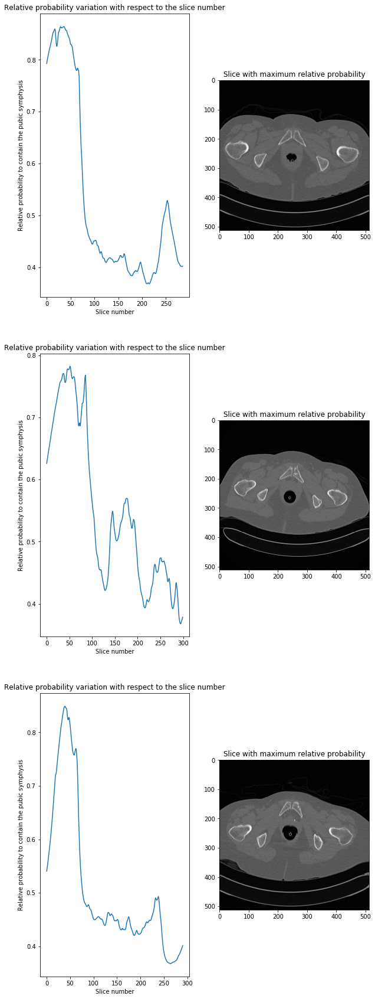

In [22]:
# Call the function to train a Nearest Centroid classifier with unbalanced classes
# Model contains the classifier and "cent" contains the centroid of the pubic symphysis class
Model,cent=train_classifier(group_array,label,cv=10)

# Test the Nearest Centroid classifier with slices from Common Images and get the slices with the highest score in each case
#slice_max=pubic_symphysis_selection(common_array,Model,cent)
slice_max=pubic_symphysis_selection(common_array,Model,cent)
    
print(slice_max)

# TRASH CELLS: WE HAVE JUST LEFT THEM IF YOU ARE CURIOUS TO SEE HOW HAVE BEEN THE INTERMEDIATE STEPS OF OUR WORK

itk::simple::Transform
 AffineTransform (0000025B767E3EF0)
   RTTI typeinfo:   class itk::AffineTransform<double,3>
   Reference Count: 3
   Modified Time: 6012938
   Debug: Off
   Object Name: 
   Observers: 
     none
   Matrix: 
     0.99468 -0.00209585 -0.00155393 
     -0.00615839 1.00725 -0.00573963 
     0.000526105 0.000541194 0.999735 
   Offset: [1.94653, -18.9578, -1345.32]
   Center: [1, -129, 842.698]
   Translation: [0.902081, -24.7363, -1345.61]
   Inverse: 
     1.00536 0.00209107 0.00157468 
     0.00614379 0.992809 0.00570942 
     -0.000532391 -0.000538545 1.00026 
   Singular: 0

--------
Optimizer stop condition: GradientDescentOptimizerv4Template: Convergence checker passed at iteration 24.
Number of iterations: 24
--------
itk::simple::Transform
 BSplineTransform (0000025B772279E0)
   RTTI typeinfo:   class itk::BSplineTransform<double,3,3>
   Reference Count: 3
   Modified Time: 9955919
   Debug: Off
   Object Name: 
   Observers: 
     none
   CoefficientImage:

TypeError: descriptor 'flatten' requires a 'numpy.ndarray' object but received a 'Image'

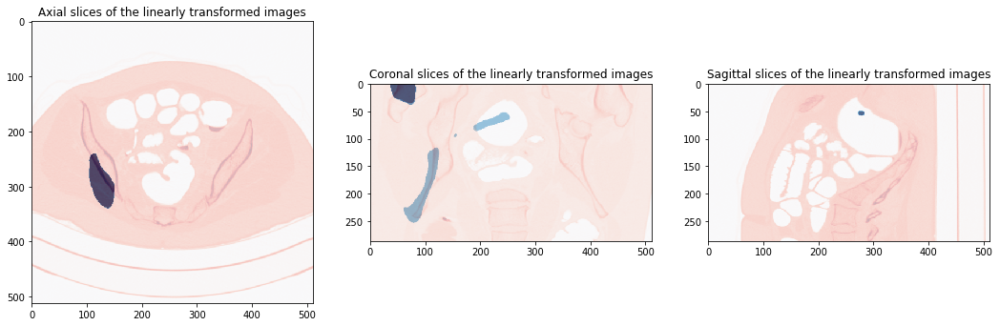

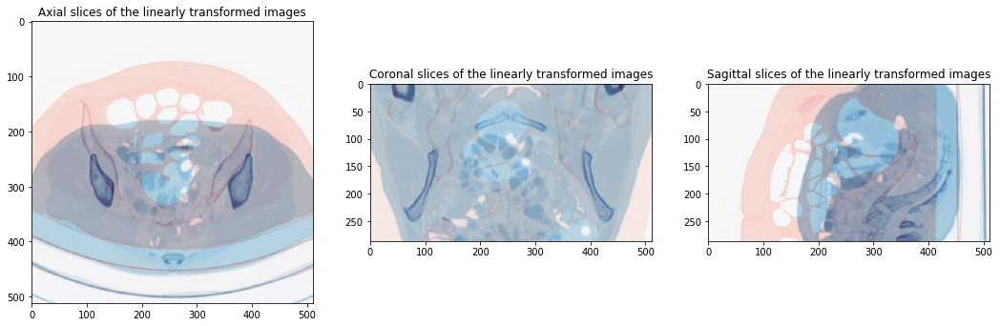

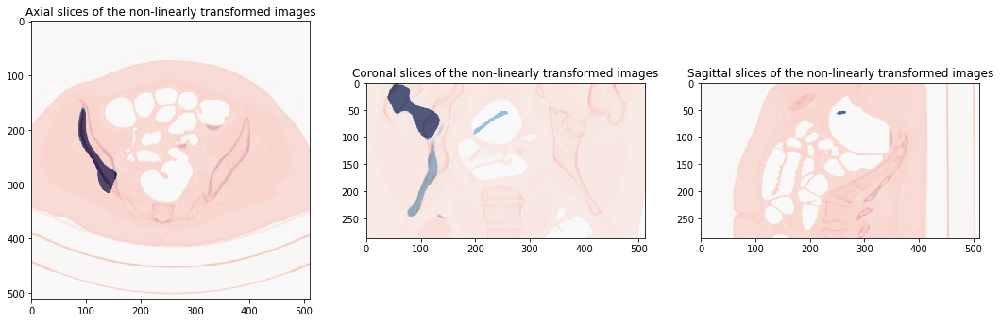

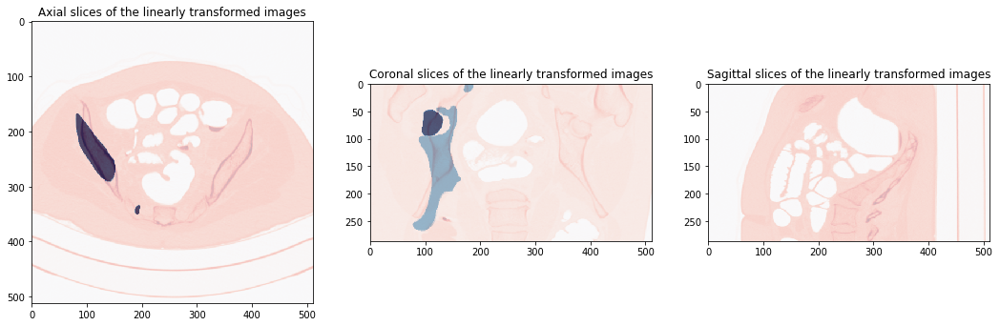

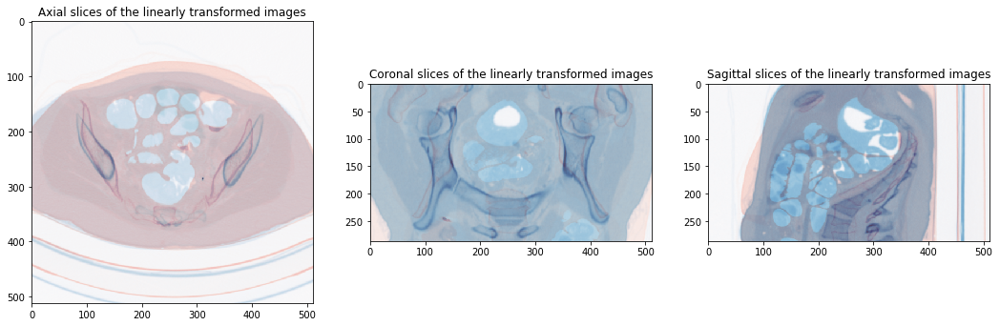

...

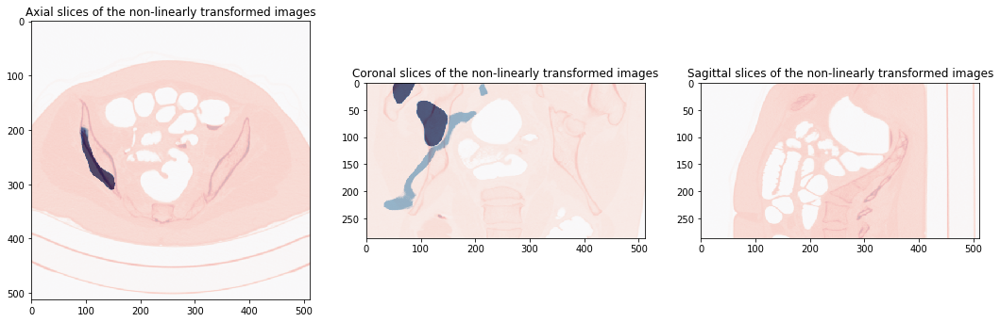

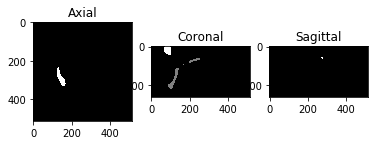

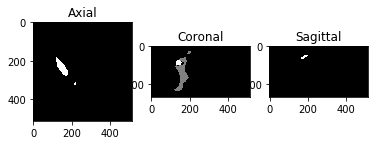

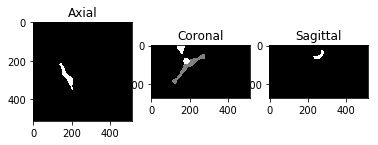

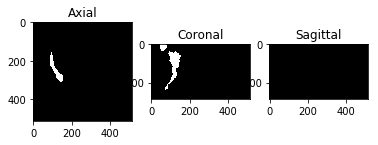

In [11]:
# Apply atlas-based segmentation:
# Take as atlas the group images and provide an atlas-based registration for each common image

atlas_seg_result=[]
dice_dist=[]
hausdorff=[]
#for i in range(len(common)):
    # Perform atlas-based segmentation
i=0
atlas_seg,registration_mask=seg_atlas(common[i],group,mask_group)

atlas_seg_result.append(sitk.GetImageFromArray(atlas_seg))

# Compute Dice coefficient between the atlas-based segmentation result and the common masks (obtained by a radiologist)
d=dice(np.ndarray.flatten(atlas_seg),np.ndarray.flatten(mask_common_array[i]))
print("Dice coefficient for common image {}: {:.2f}".format(40+i,d))
dice_dist.append(d)

# Compute Hausdorff distance between the atlas-based segmentation result and the common masks (obtained by a radiologist)
h=Hausdorff_dist(atlas_seg,mask_common_array[i])
print("Hausdorff distance for common image {}: {:.2f}".format(40+i,h))
hausdorff.append(h)

In [35]:
# Compute Dice coefficient between the atlas-based segmentation result and the common masks (obtained by a radiologist)
d=dice(np.ndarray.flatten(atlas_seg),np.ndarray.flatten(mask_common_array[i]))
print("Dice coefficient for common image {}: {:.2f}".format(40+i,d))
#d.append(d)

# Compute Hausdorff distance between the atlas-based segmentation result and the common masks (obtained by a radiologist)
h=Hausdorff_dist(atlas_seg,mask_common_array[i])
print("Hausdorff distance for common image {}: {:.2f}".format(40+i,h))
#h.append(h)

Dice coefficient for common image 40: 0.73
Hausdorff distance for common image 40: 73.66


Text(0.5, 1.0, 'Axial slices of the non-linearly transformed images')

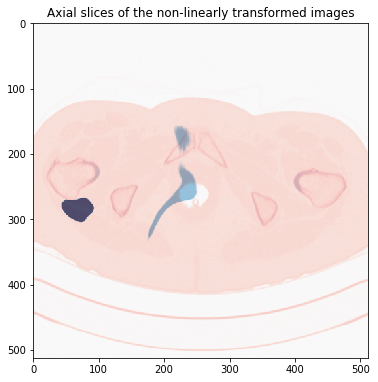

In [72]:
plt.figure(figsize=(6,15))
plt.imshow(sitk.GetArrayFromImage(nl_reg_mask[:,:,40]),cmap='Blues')
plt.imshow(sitk.GetArrayFromImage(common[0][:,:,40]),cmap='Reds',alpha=0.3)
plt.title('Axial slices of the non-linearly transformed images')



In [38]:
img=sitk.GetImageFromArray(atlas_seg)
sitk.WriteImage(img,'Atlas_based_segmentationCommon40new.nii')
for i in range(3):
    img=sitk.GetImageFromArray(registration_mask[i])
    sitk.WriteImage(img,'SegmentationMaskCommon40Group6'+str(i+2)+'.nii')

In [33]:
dice(np.ndarray.flatten(atlas_seg),np.ndarray.flatten(mask_common_array[i]))

TypeError: 'list' object is not callable

In [104]:
from scipy.spatial.distance import dice
d=dice(np.ndarray.flatten(atlas_seg_result[0]),np.ndarray.flatten(mask_common_array[0]))
print(h)
print(d)

81.91458966508958
0.7193159789368014


itk::simple::Transform
 AffineTransform (0000025B767E3240)
   RTTI typeinfo:   class itk::AffineTransform<double,3>
   Reference Count: 3
   Modified Time: 27334338
   Debug: Off
   Object Name: 
   Observers: 
     none
   Matrix: 
     1.03596 -0.0033437 -0.00365134 
     -0.0334296 1.0413 -0.00406144 
     0.00281572 0.00169782 1.00947 
   Offset: [8.19041, 7.88733, -152.085]
   Center: [-8, -131, -343.497]
   Translation: [9.59499, 4.13955, -155.584]
   Inverse: 
     0.96538 0.0030942 0.0035043 
     0.0309816 0.960431 0.00397619 
     -0.00274484 -0.00162396 0.990598 
   Singular: 0

--------
Optimizer stop condition: GradientDescentOptimizerv4Template: Convergence checker passed at iteration 121.
Number of iterations: 121
--------
itk::simple::Transform
 BSplineTransform (0000025B6D425990)
   RTTI typeinfo:   class itk::BSplineTransform<double,3,3>
   Reference Count: 3
   Modified Time: 31573995
   Debug: Off
   Object Name: 
   Observers: 
     none
   CoefficientImage: [ 0000

TypeError: 'list' object is not callable

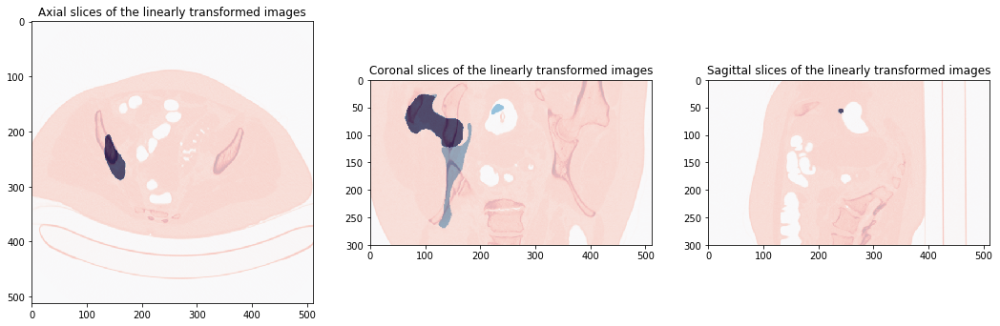

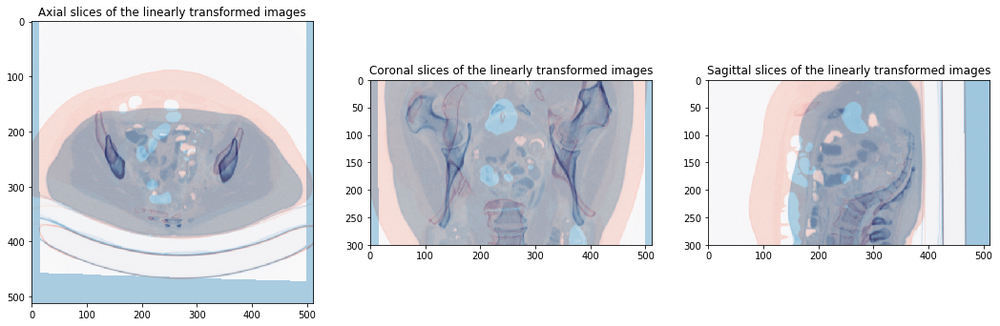

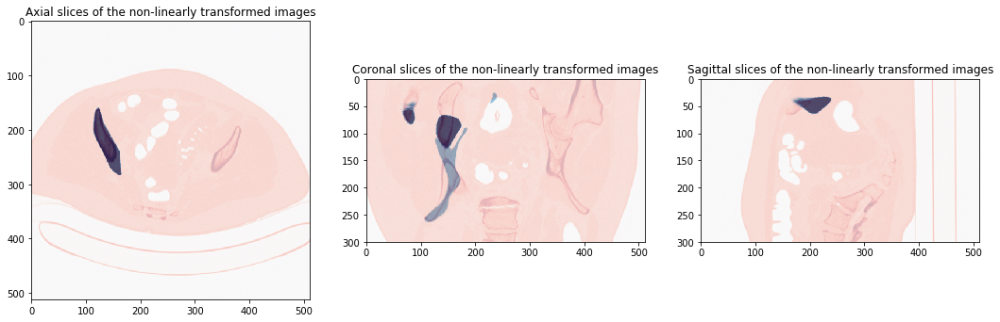

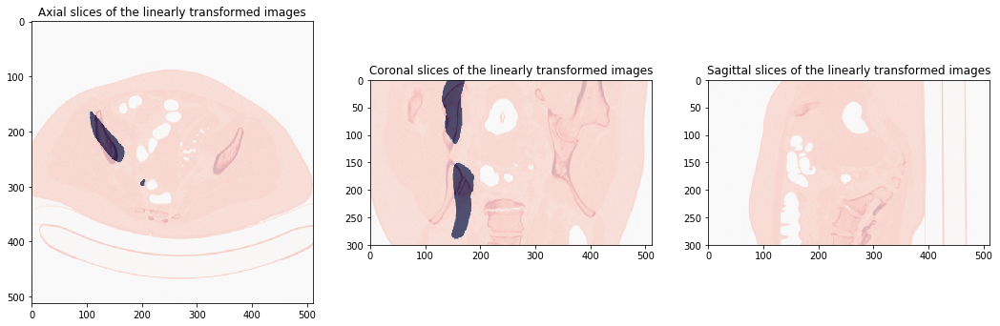

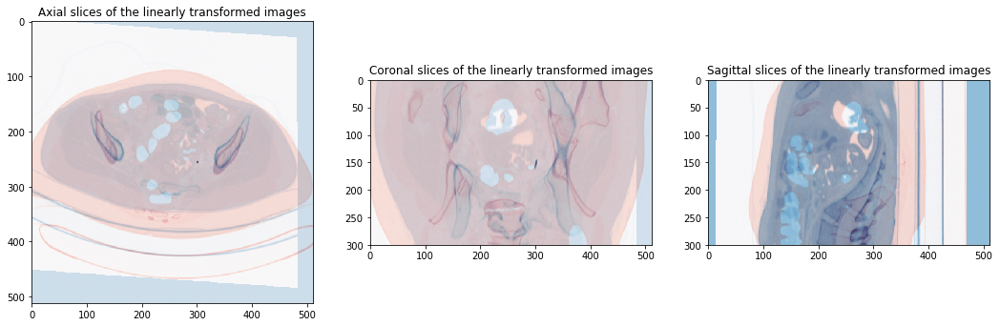

...

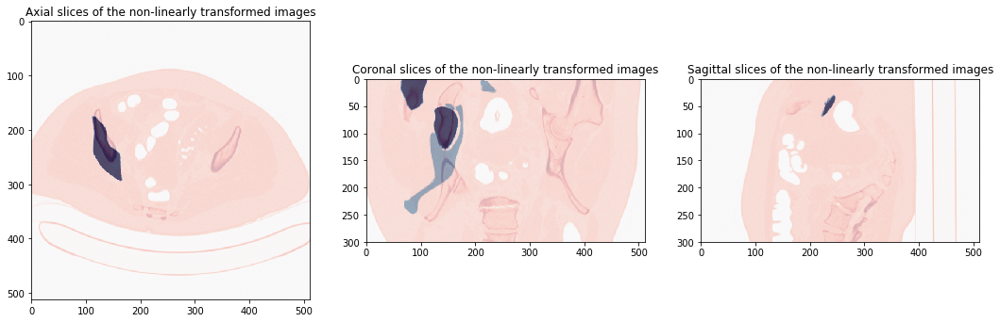

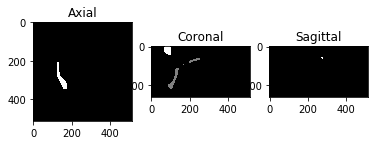

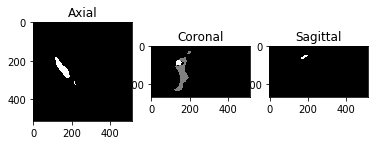

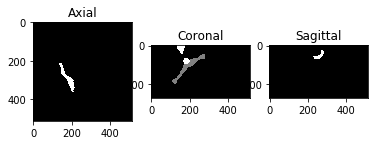

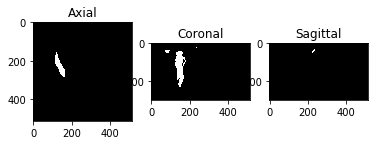

In [39]:
# Apply atlas-based segmentation:
# Take as atlas the group images and provide an atlas-based registration for each common image

atlas_seg_result=[]
dice=[]
hausdorff=[]
#for i in range(len(common)):
    # Perform atlas-based segmentation
i=1
atlas_seg,registration_mask=seg_atlas(common[i],group,mask_group)

atlas_seg_result.append(sitk.GetImageFromArray(atlas_seg))

# Compute Dice coefficient between the atlas-based segmentation result and the common masks (obtained by a radiologist)
d=dice(np.ndarray.flatten(atlas_seg),np.ndarray.flatten(mask_common_array[i]))
print("Dice coefficient for common image {}: {:.2f}".format(40+i,d))
dice.append(d)

# Compute Hausdorff distance between the atlas-based segmentation result and the common masks (obtained by a radiologist)
h=Hausdorff_dist(atlas_seg,mask_common_array[i])
print("Hausdorff distance for common image {}: {:.2f}".format(40+i,h))
hausdorff.append(h)

itk::simple::Transform
 AffineTransform (000002DEA7D985A0)
   RTTI typeinfo:   class itk::AffineTransform<double,3>
   Reference Count: 3
   Modified Time: 3070319
   Debug: Off
   Object Name: 
   Observers: 
     none
   Matrix: 
     0.991683 0.00626065 0.000449251 
     0.0109431 1.00603 -0.0054822 
     0.00156189 0.0012866 1.00502 
   Offset: [-3.86013, -33.4739, -134.855]
   Center: [9, -125, -365.002]
   Translation: [-4.88154, -32.1285, -136.833]
   Inverse: 
     1.00846 -0.00627512 -0.000485018 
     -0.010978 0.994065 0.00542736 
     -0.00155318 -0.00126282 0.995001 
   Singular: 0

--------
Optimizer stop condition: GradientDescentOptimizerv4Template: Convergence checker passed at iteration 50.
Number of iterations: 50
--------
itk::simple::Transform
 BSplineTransform (000002DEA0BA2DC0)
   RTTI typeinfo:   class itk::BSplineTransform<double,3,3>
   Reference Count: 3
   Modified Time: 7191058
   Debug: Off
   Object Name: 
   Observers: 
     none
   CoefficientImage: [ 0

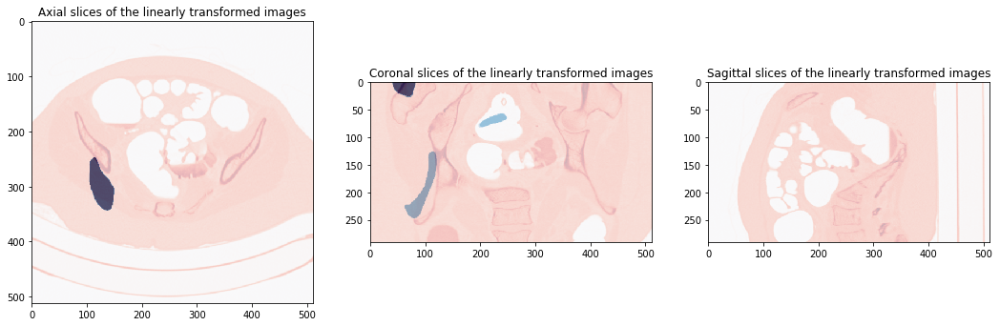

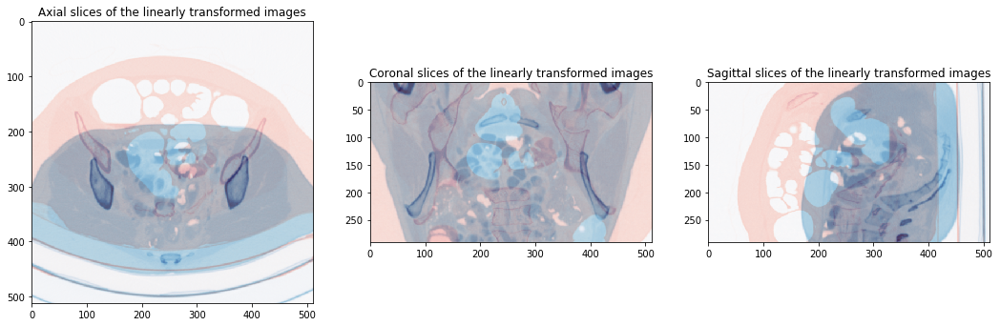

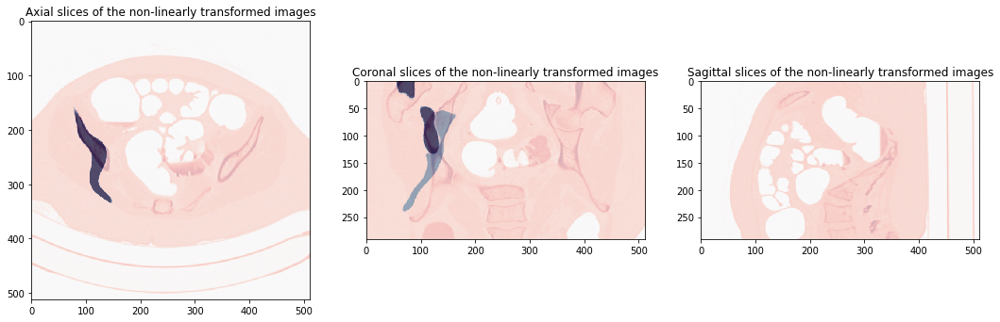

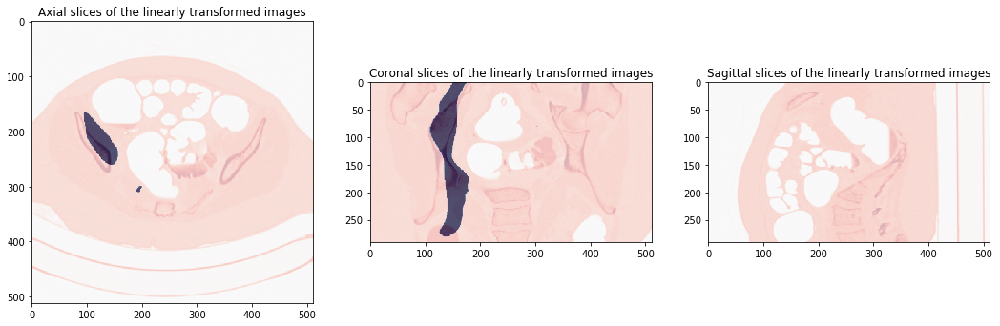

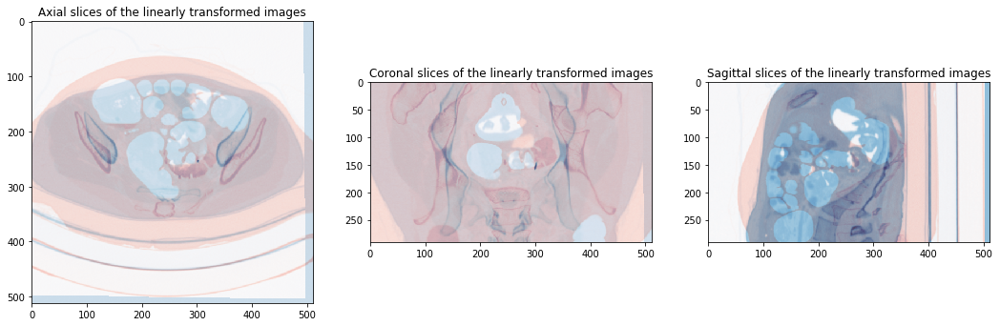

...

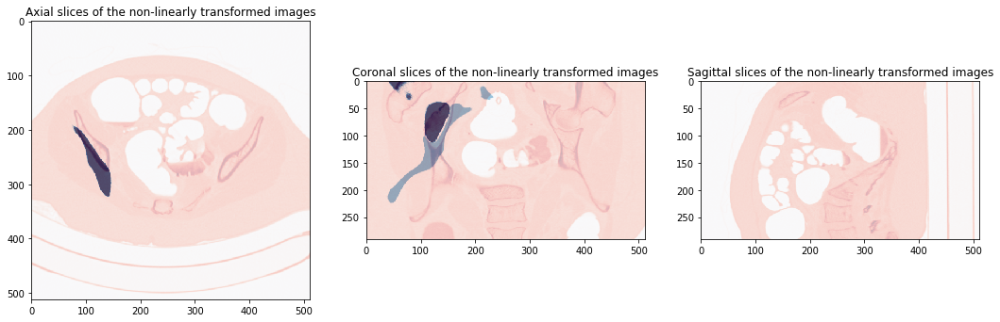

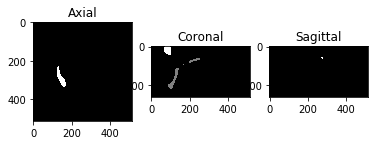

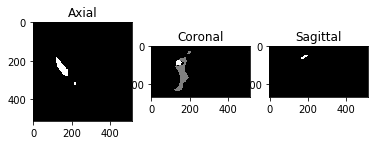

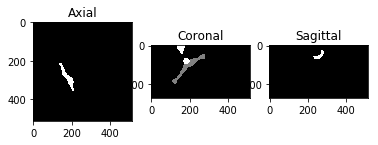

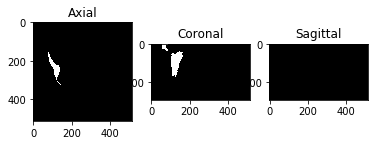

In [10]:
# Apply atlas-based segmentation:
# Take as atlas the group images and provide an atlas-based registration for each common image

atlas_seg_result=[]
dice_dist=[]
hausdorff=[]
#for i in range(len(common)):
    # Perform atlas-based segmentation
i=2
atlas_seg,registration_mask=seg_atlas(common[i],group,mask_group)

atlas_seg_result.append(sitk.GetImageFromArray(atlas_seg))

# Compute Dice coefficient between the atlas-based segmentation result and the common masks (obtained by a radiologist)
d=dice(np.ndarray.flatten(atlas_seg),np.ndarray.flatten(mask_common_array[i]))
print("Dice coefficient for common image {}: {:.2f}".format(40+i,d))
#dice_dist.append(d)

# Compute Hausdorff distance between the atlas-based segmentation result and the common masks (obtained by a radiologist)
h=Hausdorff_dist(atlas_seg,mask_common_array[i])
print("Hausdorff distance for common image {}: {:.2f}".format(40+i,h))
hausdorff.append(h)

img=sitk.GetImageFromArray(atlas_seg)
sitk.WriteImage(img,'Atlas_based_segmentationCommon41.nii')
for i in range(3):
    img=sitk.GetImageFromArray(registration_mask[i])
    sitk.WriteImage(img,'SegmentationMaskCommon41Group6'+str(i+2)+'.nii')



In [11]:
img=sitk.GetImageFromArray(atlas_seg)
sitk.WriteImage(img,'Atlas_based_segmentationCommon42.nii')
for i in range(3):
    img=sitk.GetImageFromArray(registration_mask[i])
    sitk.WriteImage(img,'SegmentationMaskCommon42Group6'+str(i+2)+'.nii')

In [3]:
# TASK 5: ANALYSIS

# Initialize labels with pubic symphysis

# For group 62:
a=np.zeros(55)
b=np.ones(16)
c=np.zeros(190)

d=np.concatenate((a,b,c))

# For group 63:
a=np.zeros(51)
b=np.ones(20)
c=np.zeros(198)

e=np.concatenate((a,b,c))

# For group 64:
a=np.zeros(44)
b=np.ones(30)
c=np.zeros(198)

f=np.concatenate((a,b,c))

#g=np.concatenate(d,e,f)

# Final list with labels:
label=[d,e,f]

[0.85185185 0.90123457 0.90123457 0.92592593 0.95061728 0.95061728
 1.         1.         1.         0.93670886]


36
51
39


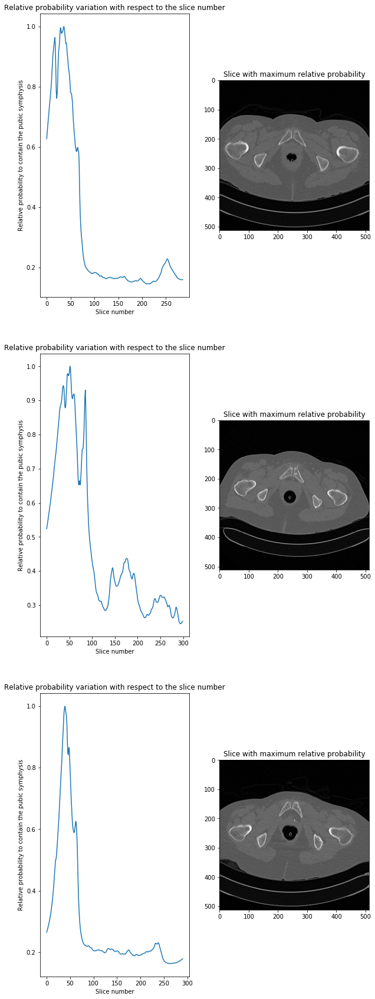

In [24]:
slice_max=pubic_symphysis_selection(common_array,Model,cent)

In [26]:
print(np.ndarray.flatten(common_array[i][j,148:214,178:248]).shape)

(4620,)


In [108]:
print(test[ind[0][j],:])

IndexError: index 35 is out of bounds for axis 0 with size 35

In [104]:
print(1.1/np.asarray(dist))

[0.72170552 0.7584362  0.81781863 0.85356519 0.86483094 0.88313586
 0.91471933 0.92569812 0.9183406  0.90758212 0.91171437 0.91118456
 0.91802972 0.92305974 0.92931421 0.92151577 0.90721878 0.89362844
 0.8766555  0.8786875  0.86865398 0.84557175 0.8310684  0.81299421
 0.79856861 0.78891202 0.77466764 0.74853458 0.7259735  0.7236555
 0.72135358 0.70979504 0.69474631 0.66272059 0.6365843  0.49843057
 0.49938476 0.50102859 0.50712255 0.51408455 0.52196214 0.52666902
 0.52753666 0.52818074 0.52660764 0.52898599 0.53534588 0.54369367
 0.55006958 0.55754735 0.5598699  0.55578702 0.54923891 0.54451474
 0.54335024 0.53874683 0.53919124 0.53179766 0.51681013 0.50601018
 0.35810816 0.36940207 0.38477936 0.40063373 0.41775549 0.43401371
 0.45426588 0.47541484 0.49447345 0.51633599 0.54136225 0.56373037
 0.58065521 0.60621124 0.63327095 0.65180611 0.67727795 0.69896528
 0.70609472 0.71173044 0.70328909 0.69486165 0.68944576 0.6740119
 0.63172972 0.6019617  0.59947977 0.61583718 0.61523809 0.588889

itk::simple::Transform
 AffineTransform (000001ADE63BD3F0)
   RTTI typeinfo:   class itk::AffineTransform<double,3>
   Reference Count: 3
   Modified Time: 3012844
   Debug: Off
   Object Name: 
   Observers: 
     none
   Matrix: 
     0.989778 -0.00299953 0.00119588 
     -0.00900353 1.01321 -0.00439392 
     0.00158321 0.00171096 1.00072 
   Offset: [0.21146, -20.0181, -1345.33]
   Center: [1, -129, 842.698]
   Translation: [1.59594, -25.434, -1344.94]
   Inverse: 
     1.01036 0.0029931 -0.00119425 
     0.00897118 0.986982 0.00432286 
     -0.00161379 -0.0016922 0.999271 
   Singular: 0

--------
Optimizer stop condition: GradientDescentOptimizerv4Template: Convergence checker passed at iteration 37.
Number of iterations: 37
--------
itk::simple::Transform
 BSplineTransform (000001ADE6D05930)
   RTTI typeinfo:   class itk::BSplineTransform<double,3,3>
   Reference Count: 3
   Modified Time: 6940392
   Debug: Off
   Object Name: 
   Observers: 
     none
   CoefficientImage: [ 0000

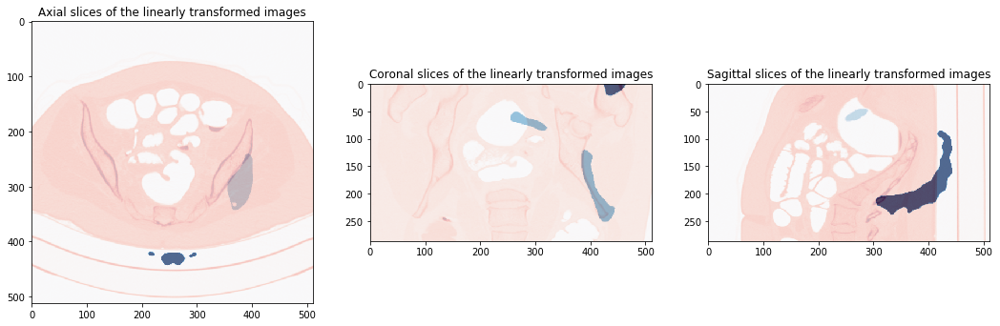

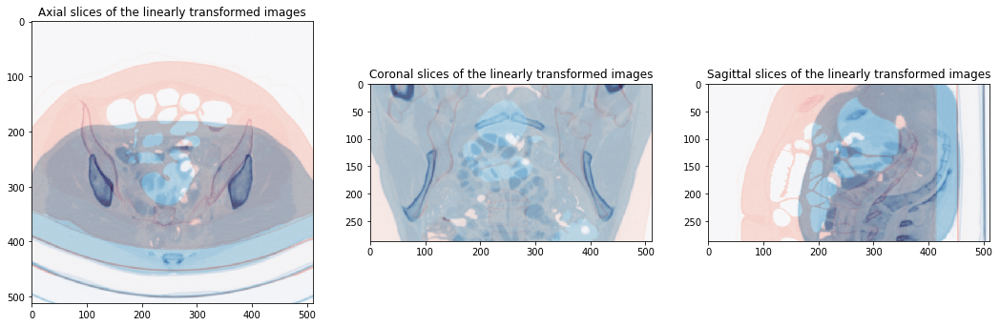

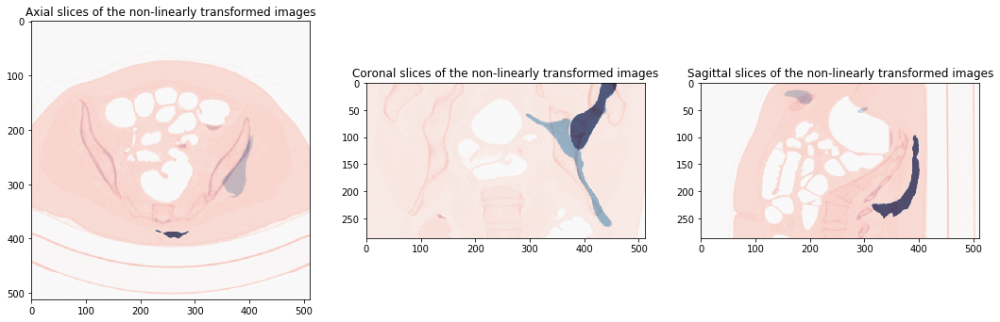

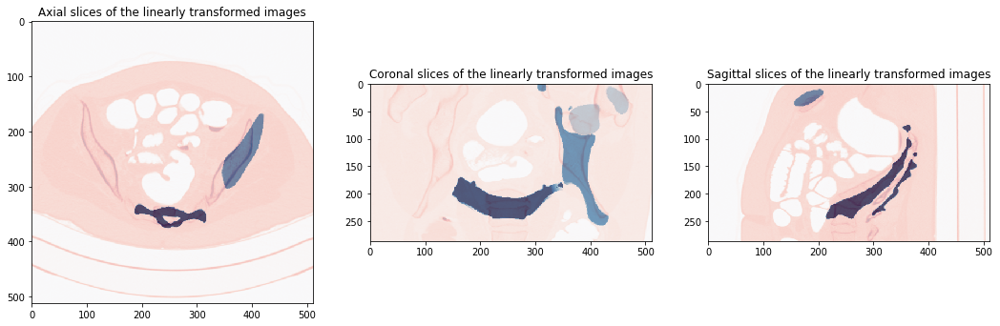

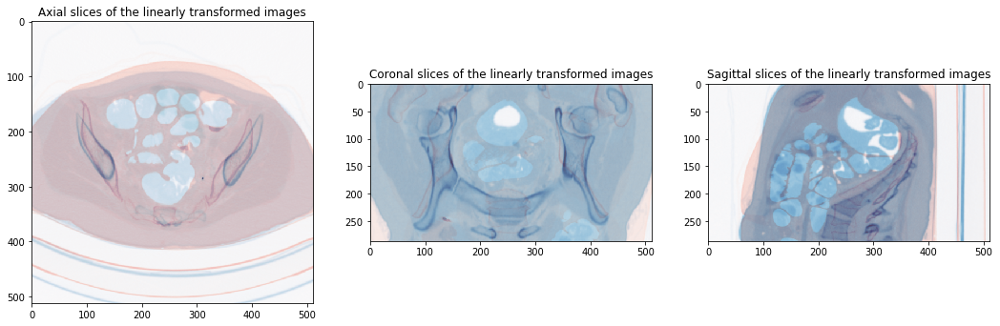

...

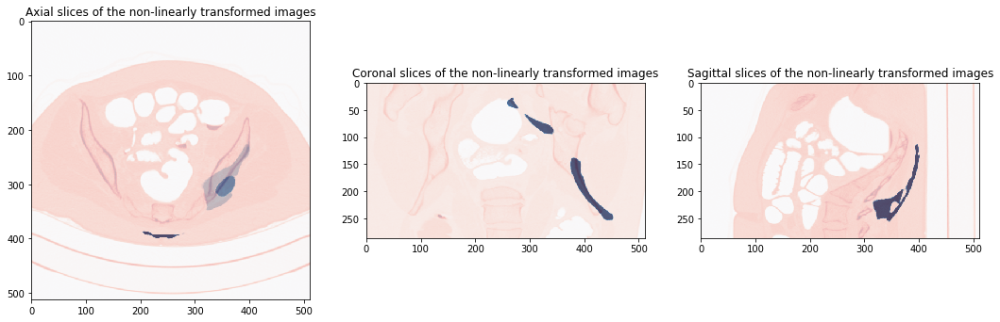

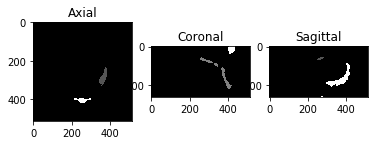

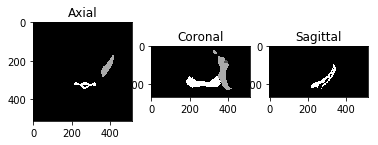

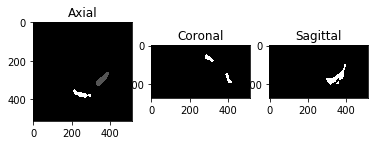

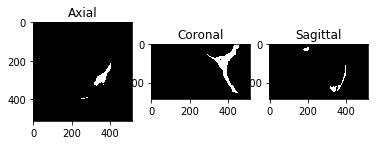

In [15]:
# REGISTRATION BONUS PART

# Apply atlas-based segmentation:
# Take as atlas the group images and provide an atlas-based registration for each common image

atlas_seg_result=[]
dice_dist=[]
hausdorff=[]
#for i in range(len(common)):
    # Perform atlas-based segmentation
i=0
atlas_seg,registration_mask=seg_atlas(common[i],group,mask_group)

atlas_seg_result.append(sitk.GetImageFromArray(atlas_seg))

# Compute Dice coefficient between the atlas-based segmentation result and the common masks (obtained by a radiologist)
d=dice(np.ndarray.flatten(atlas_seg),np.ndarray.flatten(mask_common_array[i]))
print("Dice coefficient for common image {}: {:.2f}".format(40+i,d))
#dice_dist.append(d)

# Compute Hausdorff distance between the atlas-based segmentation result and the common masks (obtained by a radiologist)
h=Hausdorff_dist(atlas_seg,mask_common_array[i])
print("Hausdorff distance for common image {}: {:.2f}".format(40+i,h))
hausdorff.append(h)

img=sitk.GetImageFromArray(atlas_seg)
sitk.WriteImage(img,'Atlas_based_segmentationCommon40_bonus.nii')
for i in range(3):
    img=sitk.GetImageFromArray(registration_mask[i])
    sitk.WriteImage(img,'SegmentationMaskCommon40Group6'+str(i+2)+'_bonus.nii')

In [72]:
#ind1=np.where(mask_common_array[0]==1.0)
#ind3=np.where(mask_common_array[0]==3.0)
ind2=np.where(mask_common_array[2]==2.0)
ind4=np.where(mask_common_array[2]==4.0)
ind5=np.where(mask_common_array[2]==5.0)
mask_com=np.copy(mask_common_array[2])
#mask_com[ind1]=0.0
#mask_com[ind3]=0.0
mask_com[ind2]=0.0
mask_com[ind4]=0.0
mask_com[ind5]=0.0
img=sitk.ReadImage('Atlas_based_segmentationCommon42.nii',sitk.sitkFloat32)
mask_com.astype(np.int32)
#img=sitk.GetArrayFromImage(img)
#h=sitk.HausdorffDistanceImageFilter()
#h.Execute(sitk.GetImageFromArray(mask_com),img)
#print(h.GetHausdorffDistance())

measure=sitk.SimilarityIndexImageFilter()
measure.Execute(sitk.GetImageFromArray(mask_com),img)
print(measure)

itk::simple::SimilarityIndexImageFilter
  SimilarityIndex: 0.550176
  Debug: 0
  NumberOfThreads: 8
  Commands: (none)
  ProgressMeasurement: 1
  ActiveProcess: (none)



In [61]:
imag=sitk.GetArrayFromImage(img)
print(mask_com.shape)

(291, 512, 512)
